<a href="https://colab.research.google.com/github/lxndrshm/DLFS_NLP_Onion_ML/blob/main/code/Project_Notebook_final_alex.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Fake News Headline Detection**

**Introduction**

Overview on what is "The Onion"
and Overview on Subreddit "Nottheonion"

Link to quiz: https://forms.gle/jrugfy4WUVjf5oSq5

## **Overview of the dataset**

Link to the dataset: https://raw.githubusercontent.com/lukefeilberg/onion/master/OnionOrNot.csv

In [207]:
import pandas as pd

In [208]:
df = pd.read_csv("https://raw.githubusercontent.com/lukefeilberg/onion/master/OnionOrNot.csv")

In [209]:
df

,text,label
0,Entire Facebook Staff Laughs As Man Tightens P...,1
1,Muslim Woman Denied Soda Can for Fear She Coul...,0
2,Bold Move: Hulu Has Announced That They’re Gon...,1
3,Despondent Jeff Bezos Realizes He’ll Have To W...,1
4,"For men looking for great single women, online...",1
...,...,...
23995,Teen Pregnancy Rate Prompting More High School...,1
23996,Connecticut TV station under fire after using ...,0
23997,Jurisprudence Fetishist Gets Off On Technicality,1
23998,Employees From Other Department Announce Plan ...,1


In [210]:
print((df.label == 1).sum()) #Onion articles
print((df.label == 0).sum()) #NotTheOnion articles, real, but "onion-like" articles

9000
15000


## **Preprocessing of the data**

remove punctuation and stopwords

Lemmatization

Tokenize + Padding


In [211]:
#remove punctuation and stopwords
import string
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

# Example:
# "I live in an nice town. I like it here."
# ---------
# "I live in an nice town I like it here"
def remove_punctuation(text):
  translator = str.maketrans("", "", string.punctuation)
  return text.translate(translator)

# Wordset contains english words, like "in", "at" etc.
stop = set(stopwords.words("english"))

# Example:
# "I live in an nice town I like it here"
# ---------
# "live nice town like"
def remove_stopwords(text):
  filtered_words = [word.lower() for word in text.split() if word.lower() not in stop]
  return " ".join(filtered_words)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [212]:
df

,text,label
0,Entire Facebook Staff Laughs As Man Tightens P...,1
1,Muslim Woman Denied Soda Can for Fear She Coul...,0
2,Bold Move: Hulu Has Announced That They’re Gon...,1
3,Despondent Jeff Bezos Realizes He’ll Have To W...,1
4,"For men looking for great single women, online...",1
...,...,...
23995,Teen Pregnancy Rate Prompting More High School...,1
23996,Connecticut TV station under fire after using ...,0
23997,Jurisprudence Fetishist Gets Off On Technicality,1
23998,Employees From Other Department Announce Plan ...,1


In [213]:
df["text"] = df.text.map(remove_punctuation)
df["text"] = df.text.map(remove_stopwords)

In [214]:
# Lemmatization
# geese -> goose
nltk.download('wordnet')
from nltk.stem import WordNetLemmatizer
#defining the object for Lemmatization
wordnet_lemmatizer = WordNetLemmatizer()

# Example:
# "live nice towns like"
# ------
# "live nice town like"
def lemmatizer(text):
  lemm_text = [wordnet_lemmatizer.lemmatize(word) for word in text.split()]
  return " ".join(lemm_text)

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [215]:
df["text"] = df.text.map(lemmatizer)

In [216]:
#create a df copy for predictions
df_pred_ten = df.copy()
#shuffling
df = df.sample(frac=1)

In [217]:
# Split dataset into training and validation set
#df_ten = df_pred_ten.iloc[[7, 2481, 17469, 17472, 17731, 17853, 17369, 17422, 17245, 19726]] #remove comment for predictions
#df = df_pred_ten.drop([7, 2481, 17469, 17472, 17731, 17853, 17369, 17422, 17245, 19726]) #remove comment for predictions
train_size = int(df.shape[0] * 0.85)

train_df = df[:train_size]
val_df = df[train_size:]

print((train_df.label == 1).sum()) #Onion articles
print((train_df.label == 0).sum()) #NotTheOnion articles, real, but "onion-like" articles

print((val_df.label == 1).sum()) #Onion articles
print((val_df.label == 0).sum()) #NotTheOnion articles, real, but "onion-like" articles

# split text and labels
train_sentences = train_df.text.to_numpy()
train_labels = train_df.label.to_numpy()
val_sentences = val_df.text.to_numpy()
val_labels = val_df.label.to_numpy()

7657
12743
1343
2257


In [218]:
### dataprep for ten examples
ten_sentences = df_ten.text.to_numpy()
ten_labels = df_ten.label.to_numpy()
ten_sequences = tokenizer.texts_to_sequences(ten_sentences)
ten_padded = pad_sequences(ten_sequences, maxlen=max_length, padding="post", truncating="post")

In [219]:
train_sentences.shape, val_sentences.shape

((20400,), (3600,))

In [220]:
from collections import Counter

# Count unique words
def counter_word(text_col):
    count = Counter()
    for text in text_col.values:
        for word in text.split():
            count[word] += 1
    return count

counter = counter_word(df.text)
num_unique_words = len(counter)
len(counter)

26815

In [221]:
# Tokenize
from tensorflow.keras.preprocessing.text import Tokenizer

# vectorize a text corpus by turning each text into a sequence of integers
tokenizer = Tokenizer(num_words=num_unique_words)
tokenizer.fit_on_texts(train_sentences) # fit only to training

In [222]:
# each word has unique index
word_index = tokenizer.word_index

In [223]:
train_sequences = tokenizer.texts_to_sequences(train_sentences)
val_sequences = tokenizer.texts_to_sequences(val_sentences)

In [224]:
# Pad the sequences to have the same length
from tensorflow.keras.preprocessing.sequence import pad_sequences

# Max number of words in a sequence
max_length = 15

train_padded = pad_sequences(train_sequences, maxlen=max_length, padding="post", truncating="post")
val_padded = pad_sequences(val_sequences, maxlen=max_length, padding="post", truncating="post")
train_padded.shape, val_padded.shape

((20400, 15), (3600, 15))

In [225]:
print(train_sentences[0])
print(train_sequences[0])
print(train_padded[0])

siri interrupt white house press briefing answer iran question
[4613, 3188, 27, 28, 672, 2749, 1633, 719, 285]
[4613 3188   27   28  672 2749 1633  719  285    0    0    0    0    0
    0]


## **Our own model**

LSTM



In [226]:
try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass

%load_ext tensorboard


The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [227]:
import os
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorboard.plugins import projector

In [228]:
import numpy as np
neg, pos = np.bincount(df['label'])
bias = np.log([pos/neg])
output_bias = tf.keras.initializers.Constant(bias)

print(bias)

[-0.51082562]


In [229]:
# Create a model.
model = tf.keras.Sequential(
    [
        tf.keras.layers.Embedding(num_unique_words, 16, input_length=max_length),
        #tf.keras.layers.LSTM(5, return_sequences=True),
        #tf.keras.layers.Dropout(0.4),
        tf.keras.layers.LSTM(10, return_sequences=True),
        tf.keras.layers.Dropout(0.4),
        tf.keras.layers.LSTM(10),
        tf.keras.layers.Dropout(0.4),
        #tf.keras.layers.Dense(8, activation="relu"),
        #tf.keras.layers.Dropout(0.4),
        tf.keras.layers.Dense(8, activation="relu"),
        tf.keras.layers.Dense(1, activation='sigmoid', bias_initializer=output_bias),
    ]
)

model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_6 (Embedding)     (None, 15, 16)            429040    
                                                                 
 lstm_12 (LSTM)              (None, 15, 10)            1080      
                                                                 
 dropout_12 (Dropout)        (None, 15, 10)            0         
                                                                 
 lstm_13 (LSTM)              (None, 10)                840       
                                                                 
 dropout_13 (Dropout)        (None, 10)                0         
                                                                 
 dense_12 (Dense)            (None, 8)                 88        
                                                                 
 dense_13 (Dense)            (None, 1)                

In [230]:
from tensorflow import keras

loss = keras.losses.BinaryCrossentropy(from_logits=True)
optim = keras.optimizers.Adam(learning_rate=0.0001)
metrics = ["accuracy"]

model.compile(loss=loss, optimizer=optim, metrics=metrics)

In [231]:
callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=1)

history = model.fit(train_padded, train_labels, epochs=10, validation_data=(val_padded, val_labels), callbacks=[callback])

Epoch 1/10


/usr/local/lib/python3.7/dist-packages/tensorflow/python/util/dispatch.py:1096: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


638/638 [==============================] - 9s 9ms/step - loss: 0.6590 - accuracy: 0.6247 - val_loss: 0.6522 - val_accuracy: 0.6269
Epoch 2/10
638/638 [==============================] - 5s 7ms/step - loss: 0.5232 - accuracy: 0.7098 - val_loss: 0.4132 - val_accuracy: 0.8178
Epoch 3/10
638/638 [==============================] - 5s 7ms/step - loss: 0.3221 - accuracy: 0.8744 - val_loss: 0.3807 - val_accuracy: 0.8364
Epoch 4/10
638/638 [==============================] - 5s 7ms/step - loss: 0.2487 - accuracy: 0.9126 - val_loss: 0.3848 - val_accuracy: 0.8439


In [232]:
# Set up a logs directory, so Tensorboard knows where to look for files.
log_dir='/logs/fake-news/'
if not os.path.exists(log_dir):
    os.makedirs(log_dir)

# Save Labels separately on a line-by-line manner.
with open(os.path.join(log_dir, 'metadata.tsv'), "w") as f:
  for subwords in word_index:
    f.write("{}\n".format(subwords))


# Save the weights we want to analyze as a variable. Note that the first
# value represents any unknown word, which is not in the metadata, here
# we will remove this value.
weights = tf.Variable(model.layers[0].get_weights()[0][1:])
# Create a checkpoint from embedding, the filename and key are the
# name of the tensor.
checkpoint = tf.train.Checkpoint(embedding=weights)
checkpoint.save(os.path.join(log_dir, "embedding.ckpt"))

# Set up config.
config = projector.ProjectorConfig()
embedding = config.embeddings.add()
# The name of the tensor will be suffixed by `/.ATTRIBUTES/VARIABLE_VALUE`.
embedding.tensor_name = "embedding/.ATTRIBUTES/VARIABLE_VALUE"
embedding.metadata_path = 'metadata.tsv'
projector.visualize_embeddings(log_dir, config)


In [233]:
# Now run tensorboard against on log data we just saved.
%tensorboard --logdir /logs/fake-news


Reusing TensorBoard on port 6006 (pid 168), started 2:49:53 ago. (Use '!kill 168' to kill it.)

<IPython.core.display.Javascript object>

In [234]:
import matplotlib.pyplot as plt

def plot_graphs(history, metric):
  plt.plot(history.history[metric])
  plt.plot(history.history['val_'+metric], '')
  plt.xlabel("Epochs")
  plt.ylabel(metric)
  plt.legend([metric, 'val_'+metric])

(0.0, 0.6795650847256184)

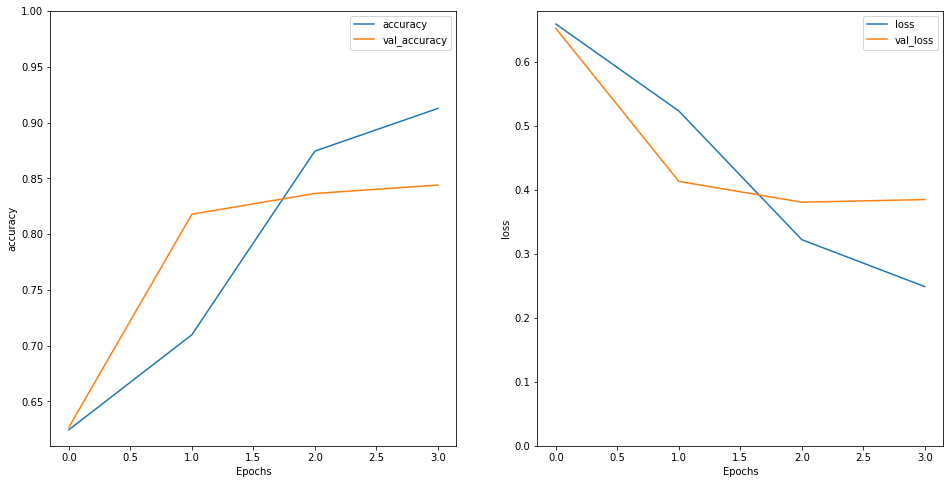

In [235]:
plt.figure(figsize=(16, 8))
plt.subplot(1, 2, 1)
plot_graphs(history, 'accuracy')
plt.ylim(None, 1)
plt.subplot(1, 2, 2)
plot_graphs(history, 'loss')
plt.ylim(0, None)

## **Transfer Learning Models**

BERT

GBT-3

## **Results of class vs best model**

In [236]:
#PREDICTION
df_ten["pred"] = model.predict(ten_padded)
df_ten

,text,label,pred
7,pokémon go player stabbed keep playing,0,0.467956
2481,report new iphone longer secretly record every...,1,0.854062
17469,batman brings suspect bradford police,0,0.110779
17472,gandalf would kick dumbledore’s as fight say g...,0,0.101528
17731,soy sauce overdose almost kill 19yearold,0,0.027792
17853,japanese firm use drone force overtime staff g...,0,0.020131
17369,senate reject pipeline plan would created thou...,1,0.032138
17422,god doubt could still create world 7 day anymo...,1,0.864159
17245,iran accuses kim kardashian working instagram ...,0,0.713680
19726,mom brings home little plaque say ‘family’,1,0.943348


Overview of different Results in an excel Sheet

## **Outlook**

What can be done in the future?

more data